In [1]:
import sys
sys.path.append("..")

In [2]:
from model import pixelcnn

In [3]:
mconv2dA = pixelcnn.MaskedConv2d(3, 3, 3, "A")
print(mconv2dA.mask)

tensor([[[[1., 1., 1.],
          [1., 0., 0.],
          [0., 0., 0.]]]])


In [4]:
mconv2dB = pixelcnn.MaskedConv2d(3, 3, 3, "B")
print(mconv2dB.mask)

tensor([[[[1., 1., 1.],
          [1., 1., 0.],
          [0., 0., 0.]]]])


In [5]:
pixelCnn = pixelcnn.PixelCNN(3, 3, 3, 4, 256)

In [6]:
import torch
print(pixelCnn(torch.rand(1, 3, 32, 32)).shape)

torch.Size([1, 3, 32, 32, 256])


In [7]:
from model import pixelsnail

In [8]:
CC2d = pixelsnail.CausalConv2d(3, 3, 3, padding="causal")
print(CC2d.pad)
print(CC2d.causal)

ZeroPad2d((1, 1, 2, 0))
1


/home/tl2020/micro/.venv/lib64/python3.9/site-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


In [13]:
import torchvision
cifar10 = torchvision.datasets.CIFAR10(
    root="~/micro/data", 
    transform=torchvision.transforms.ToTensor()
)

In [14]:
dataloader = torch.utils.data.DataLoader(
    cifar10, 
    batch_size=64, 
    shuffle=True
)

In [23]:
loss = torch.nn.CrossEntropyLoss()
import tqdm


pixelCnn = pixelCnn.to("cuda")
opt = torch.optim.Adam(pixelCnn.parameters(), lr=1e-3)

i = 0
for e in range(10):
    tqdmobj = tqdm.tqdm(dataloader)
    for x, _ in tqdmobj:
        x = x.to("cuda")
        i += 1
        # x = x.permute(0, 3, 1, 2)
        x = x.float() / 255.0
        y = pixelCnn(x)
        y = y.view(-1, 256)
        x = x.view(-1)
        l = loss(y, (x * 255).to(torch.long))
        opt.zero_grad()
        l.backward()
        tqdmobj.set_description(f"Loss: {l.item()}")
        opt.step()

Loss: 0.12862439453601837:  28%|██▊       | 218/782 [00:04<00:10, 52.46it/s]


KeyboardInterrupt: 

In [50]:
def generate_image(net, img_size=32, device="cuda"):
    img = torch.zeros(1, 3, img_size, img_size).to(device)

    for c in range(3):
        for i in range(img_size):
            for j in range(img_size):
                out = net(img)
                probs = torch.softmax(out[:, c, i, j], dim=1)
                print(probs.detach().cpu().numpy())
                img[:, c, i, j] = torch.multinomial(probs, 1).float() / 255.0

    return img


In [52]:
img = generate_image(pixelCnn)

tensor([[9.1412e-01, 8.1053e-03, 3.8345e-04, 2.1206e-04, 2.7113e-04, 2.7744e-04,
         3.0643e-04, 1.8453e-04, 2.9342e-04, 2.2312e-04, 2.4250e-04, 2.5345e-04,
         1.9713e-04, 3.2905e-04, 2.2005e-04, 3.2763e-04, 4.7546e-04, 4.9851e-04,
         5.0030e-04, 1.6538e-04, 2.2053e-04, 2.3181e-04, 1.6157e-04, 1.8733e-04,
         2.9886e-04, 1.7456e-04, 2.9095e-04, 4.0860e-04, 1.6662e-04, 2.4826e-04,
         2.1674e-04, 3.5623e-04, 2.9976e-04, 2.7516e-04, 4.4049e-04, 1.9127e-04,
         1.8120e-04, 4.5580e-04, 3.5944e-04, 2.5500e-04, 2.8977e-04, 3.7354e-04,
         2.4217e-04, 4.3246e-04, 3.1474e-04, 3.3281e-04, 3.0776e-04, 2.3723e-04,
         1.9329e-04, 4.8930e-04, 3.9253e-04, 2.5075e-04, 3.4951e-04, 1.8614e-04,
         1.9012e-04, 3.2942e-04, 4.1506e-04, 2.4939e-04, 1.8508e-04, 4.8173e-04,
         3.9824e-04, 3.4617e-04, 4.5139e-04, 3.8760e-04, 3.3257e-04, 3.9662e-04,
         2.1326e-04, 3.3728e-04, 1.6958e-04, 3.6339e-04, 3.2294e-04, 3.8730e-04,
         2.3434e-04, 2.1704e

In [47]:
img.shape

torch.Size([1, 3, 32, 32])

In [48]:
img[0] * 255

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], device='cuda:0')

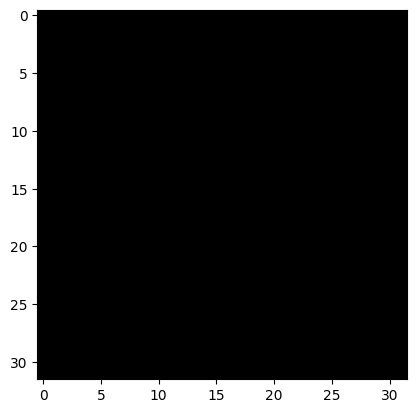

In [49]:
from matplotlib import pyplot as plt

plt.imshow(img[0].permute(1, 2, 0).detach().cpu().numpy() * 255)